# WARP-D OBJECT DETECTION MODEL USING YOLOv8

### INTRODUCTION



The dataset comes from Kaggle(https://www.kaggle.com/datasets/parohod/warp-waste-recycling-plant-dataset), and is a Waste Recycling Plant (WaRP) dataset, and it contains images from an industrial source plant. It contains 3 main folders, each with their own specific purpose: Detection (WaRP-D), Segmentation (WaRP-S), and Classification (WaRP-C). 

The main objective is to create an Object Detection Model that can accurately predict the classes on a validation dataset. With that said, we will be focusing on the WaRP-D dataset, which contains 2452 images for training, and 522 images for validation. These images have full HD resolution (1920x1080). These images are already labelled, and these are divided into the following groups (https://github.com/AIRI-Institute/WaRP/blob/main/assets/WaRP-Categories.png):

![Categories](https://raw.githubusercontent.com/AIRI-Institute/WaRP/main/assets/WaRP-Categories.png)

It is of note that there are classes with '-full'; this means that the bottle is full of air, and not flat. 

As stated earlier, the main goal is object detection, and we will be using YOLOv8 as our object detection tool. 

Some limitations of the dataset include:

1.) Object overlapping

2.) Heavily deformed items

3.) Poor lighting conditions



# CODE

We are using YOLOv8, which is the latest iteration of the YOLO algorithm, an object detection model. As such, what is required is a text file containing the number of classes, as well as a YAML file which contains the configurations needed to run YOLOv8. These files are provided in the repository. 

Let us now do a test to find out if our GPU is working with YOLOv8:

In [1]:
import torch
  
print(f"Is CUDA supported by this system? {torch.cuda.is_available()}")
print(f"CUDA version: {torch.version.cuda}")
  
# Storing ID of current CUDA device
cuda_id = torch.cuda.current_device()
print(f"ID of current CUDA device:{torch.cuda.current_device()}")  

Is CUDA supported by this system? True
CUDA version: 11.8
ID of current CUDA device:0


In [2]:
!nvidia-smi

Sun Apr 16 19:35:32 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 531.41                 Driver Version: 531.41       CUDA Version: 12.1     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                      TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf            Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce GTX 1660 T...  WDDM | 00000000:01:00.0 Off |                  N/A |
| N/A   50C    P8                5W /  N/A|      0MiB /  6144MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [1]:
from ultralytics import YOLO
!yolo checks

Ultralytics YOLOv8.0.58  Python-3.9.7 torch-2.0.0+cu118 CUDA:0 (NVIDIA GeForce GTX 1660 Ti with Max-Q Design, 6144MiB)
Setup complete  (16 CPUs, 15.4 GB RAM, 347.1/458.4 GB disk)


## MODEL TRAINING

We now proceed with training the model. I used Anaconda Prompt, but it is also okay to run with Jupyter notebook.

In [ ]:
# Doing it on Anaconda Prompt
# cd C:\Users\Patrick\Desktop\CPSC_4830\Final_Exam\yolov8\Warp-D
# yolo task=detect mode=train amp=False epochs=40 data=garbage_custom.yaml model=yolov8x.pt imgsz=640 batch=1 val=True save=True
# Batch = 1 reads all images per batch
# Batch = 2 reads roughly 1250 images per batch
# Batch = 4 needs 20.00 GB of VRAM (too much as I only have 6GB VRAM)

Here are the results:

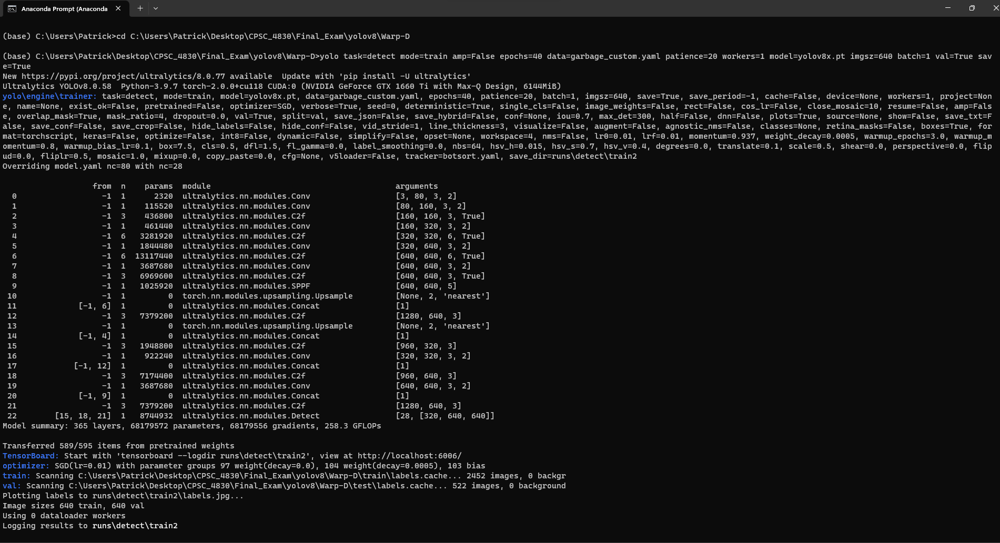

In [21]:
from PIL import Image
from IPython.display import display
train1 = Image.open("C:/Users/Patrick/Desktop/CPSC_4830/Final_Exam/yolov8/Warp-D/runs/detect/train2/35_epochs_1.png")
display(train1)

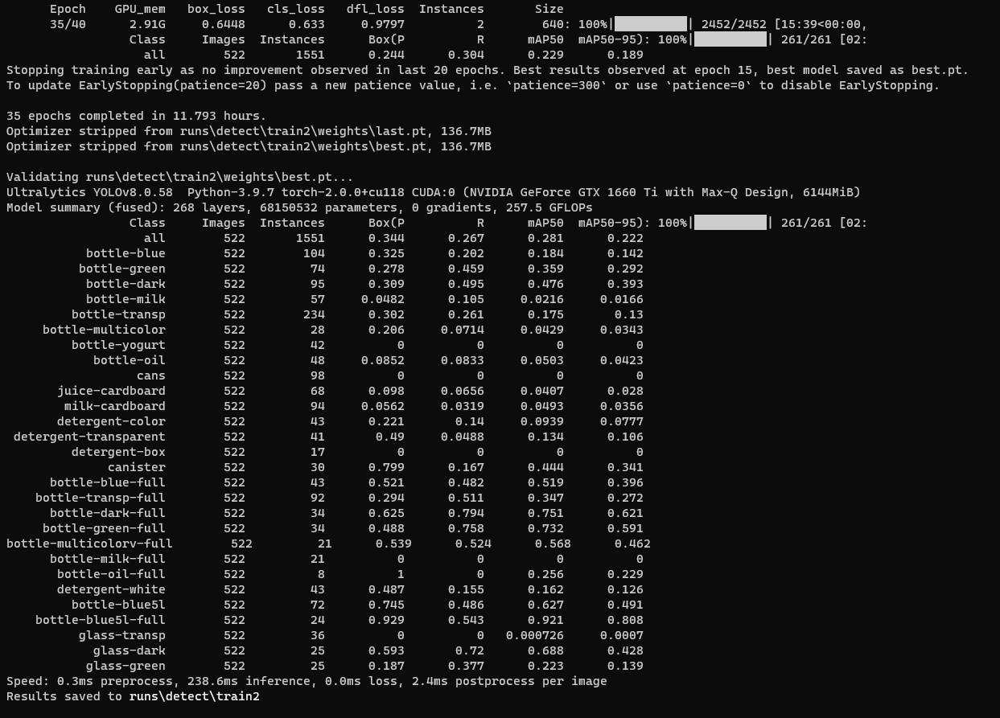

In [22]:
train2 = Image.open("C:/Users/Patrick/Desktop/CPSC_4830/Final_Exam/yolov8/Warp-D/runs/detect/train2/35_epochs_2.png")
display(train2)

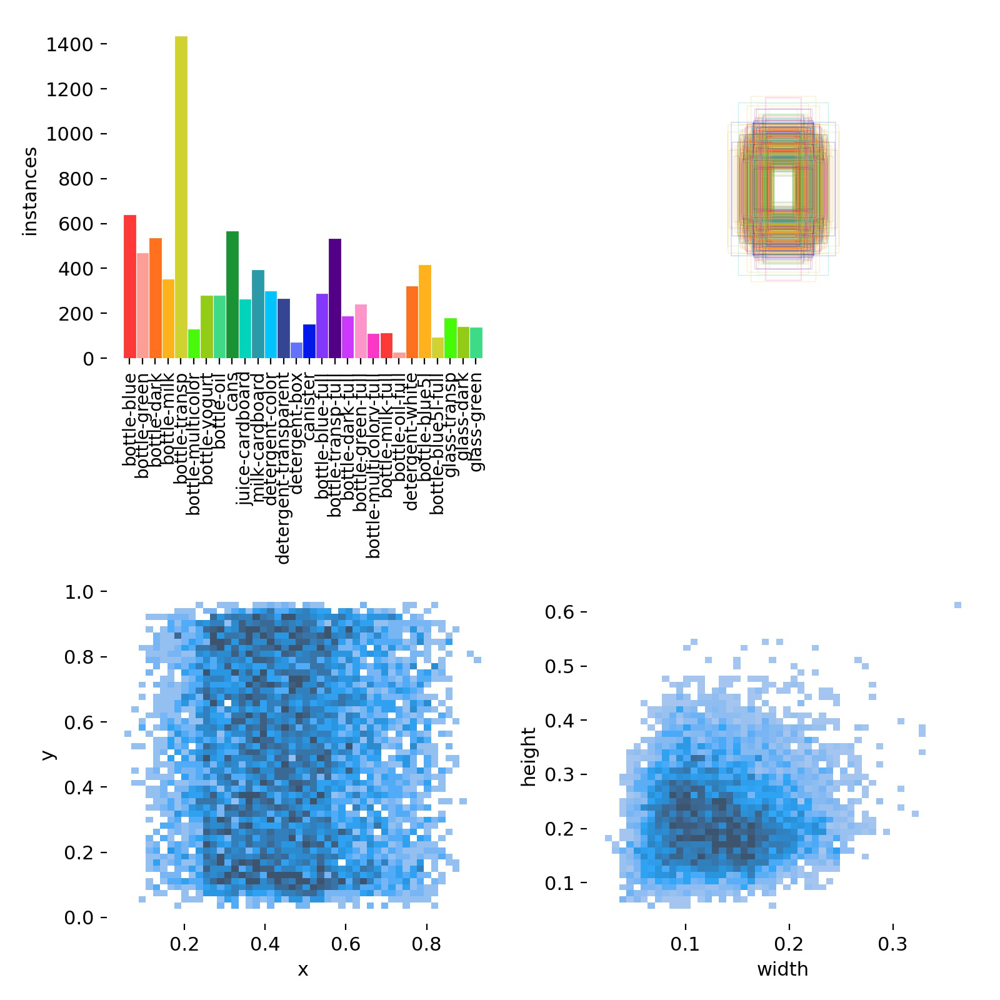

In [23]:
train3 = Image.open("C:/Users/Patrick/Desktop/CPSC_4830/Final_Exam/yolov8/Warp-D/runs/detect/train2/labels.jpg")
display(train3)

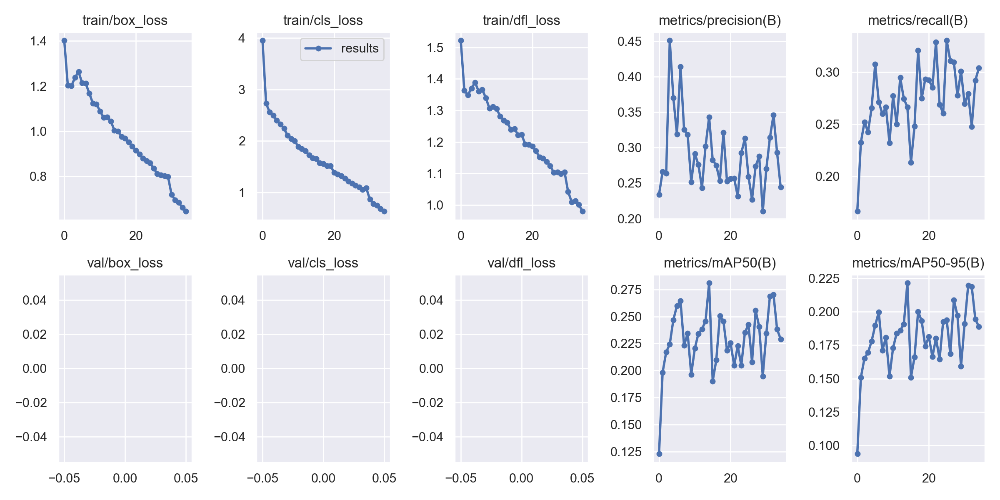

In [24]:
train4 = Image.open("C:/Users/Patrick/Desktop/CPSC_4830/Final_Exam/yolov8/Warp-D/runs/detect/train2/results.png")
display(train4)

## MODEL VALIDATION

The main reason why we are doing this is mainly to get relevant metrics, such as the confusion matrix and the relevant curves for precision, recall, and confidence. 

In [2]:
!yolo task=detect mode=val model=best_35.pt data=garbage_custom.yaml batch=1 imgsz=640 save=True

Ultralytics YOLOv8.0.58  Python-3.9.7 torch-2.0.0+cu118 CUDA:0 (NVIDIA GeForce GTX 1660 Ti with Max-Q Design, 6144MiB)
Model summary (fused): 268 layers, 68150532 parameters, 0 gradients, 257.5 GFLOPs

val: Scanning C:\Users\Patrick\Desktop\CPSC_4830\Final_Exam\yolov8\Warp-D\test\labels.cache... 522 images, 0 backgrounds, 0 corrupt: 100%|##########| 522/522 [00:00<?, ?it/s]
val: Scanning C:\Users\Patrick\Desktop\CPSC_4830\Final_Exam\yolov8\Warp-D\test\labels.cache... 522 images, 0 backgrounds, 0 corrupt: 100%|##########| 522/522 [00:00<?, ?it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/522 [00:00<?, ?it/s]WARNING  NMS time limit 0.550s exceeded

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 1/522 [00:01<10:30,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 2/522 [00:01<04:52,  1.78it/s]
 

Here are the results after validation:

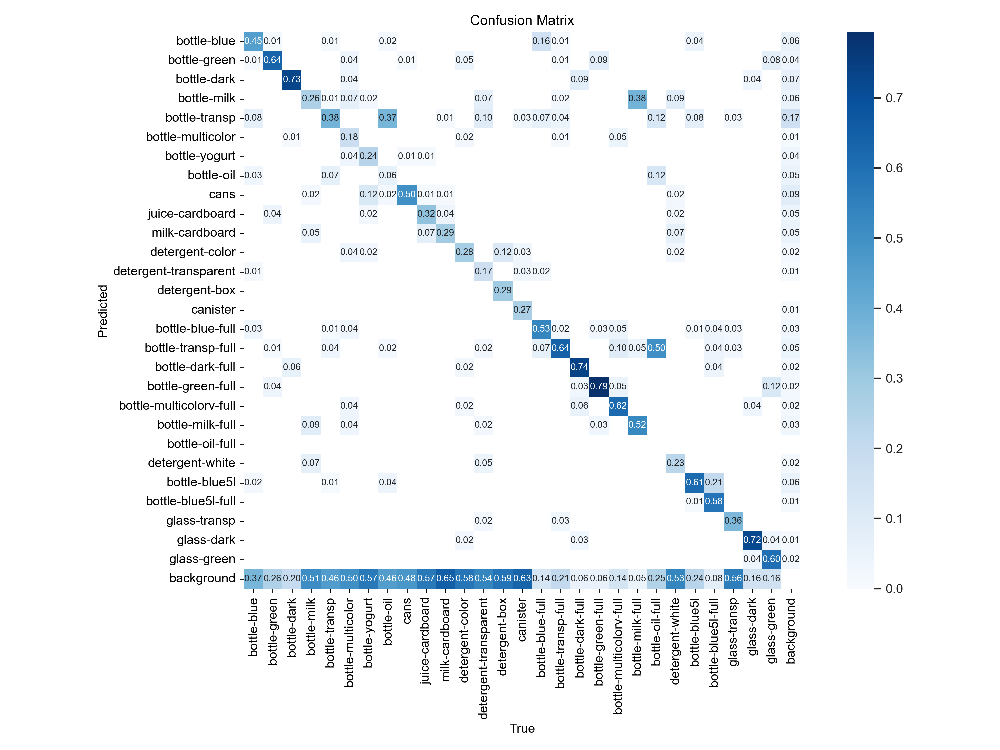

In [8]:

img1 = Image.open("C:/Users/Patrick/Desktop/CPSC_4830/Final_Exam/yolov8/Warp-D/runs/detect/val3/confusion_matrix.png")
display(img1)


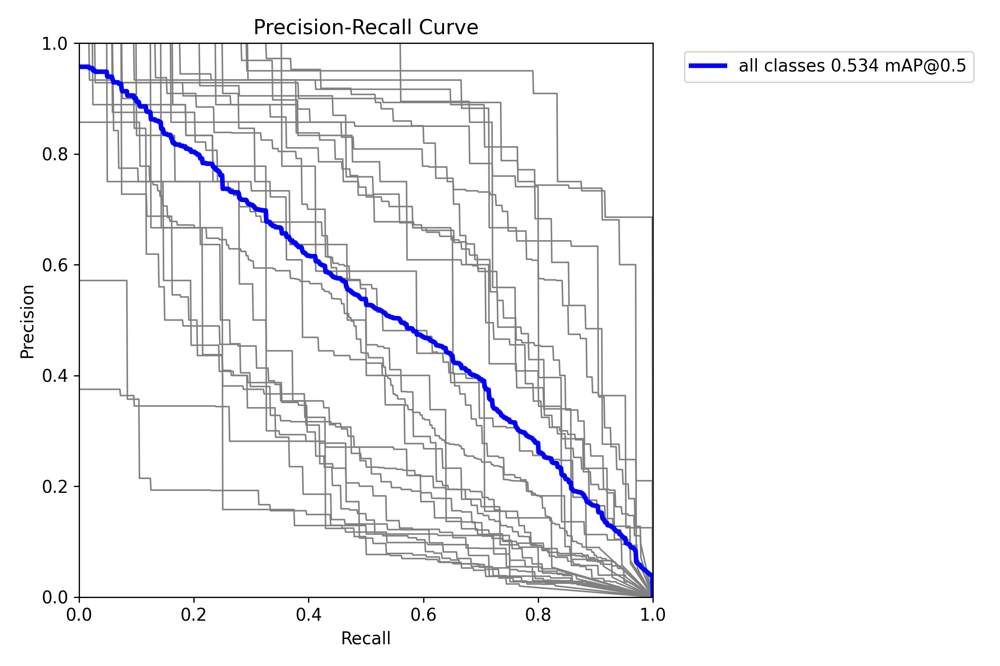

In [9]:
img2 = Image.open("C:/Users/Patrick/Desktop/CPSC_4830/Final_Exam/yolov8/Warp-D/runs/detect/val3/PR_curve.png")
display(img2)

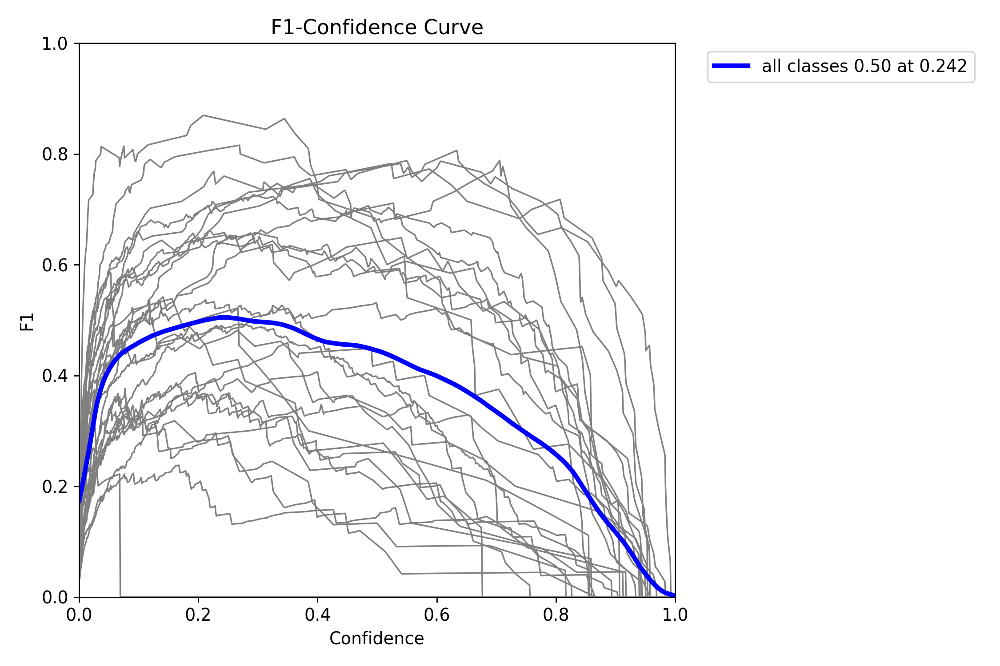

In [10]:
img3 = Image.open("C:/Users/Patrick/Desktop/CPSC_4830/Final_Exam/yolov8/Warp-D/runs/detect/val3/F1_curve.png")
display(img3)

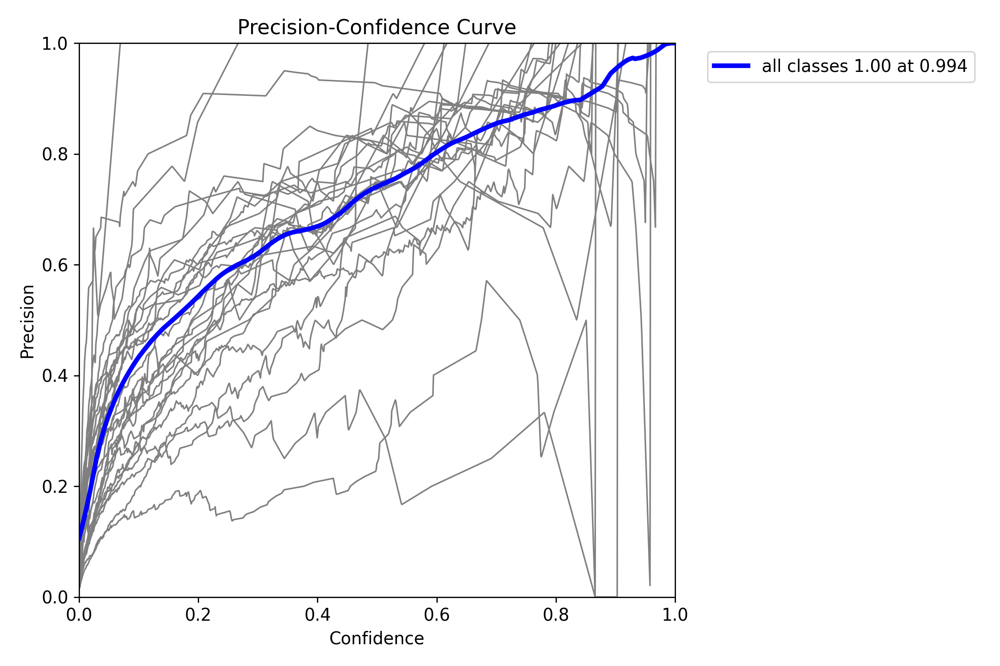

In [11]:
img4 = Image.open("C:/Users/Patrick/Desktop/CPSC_4830/Final_Exam/yolov8/Warp-D/runs/detect/val3/P_curve.png")
display(img4)

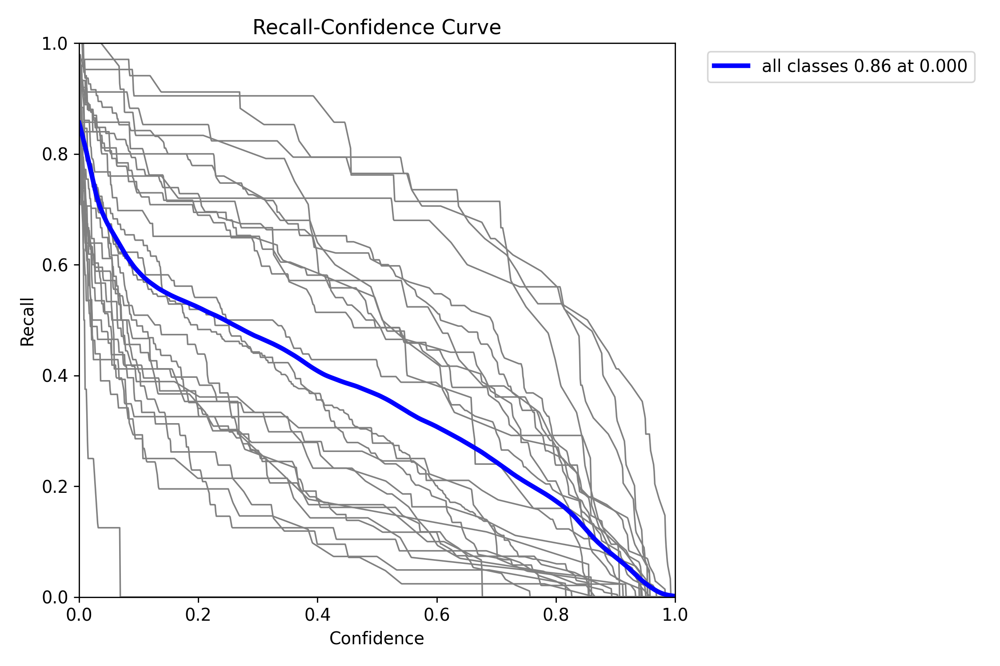

In [12]:
img5 = Image.open("C:/Users/Patrick/Desktop/CPSC_4830/Final_Exam/yolov8/Warp-D/runs/detect/val3/R_curve.png")
display(img5)

## MODEL PREDICTION

We now do predictions on our validation dataset using the model we trained. 

In [2]:
!yolo task=detect mode=predict model=best_35.pt source='C:/Users/Patrick/Desktop/CPSC_4830/Final_Exam/yolov8/Warp-D/test/images' save=True

Here are some of the results:

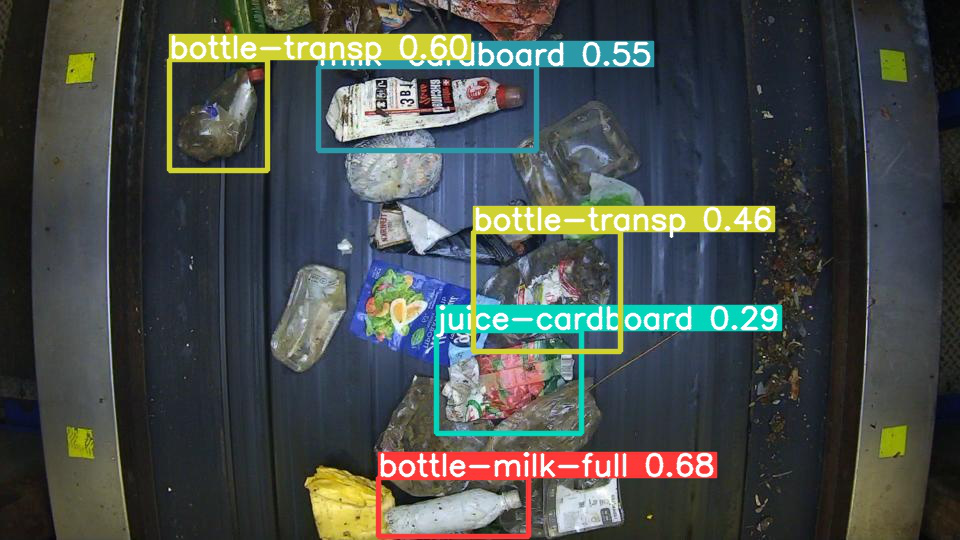

In [14]:
pred1 = Image.open("C:/Users/Patrick/Desktop/CPSC_4830/Final_Exam/yolov8/Warp-D/runs/detect/predict2/POSAD/POSAD_1_13-Sep_05-14-50.jpg")
display(pred1)

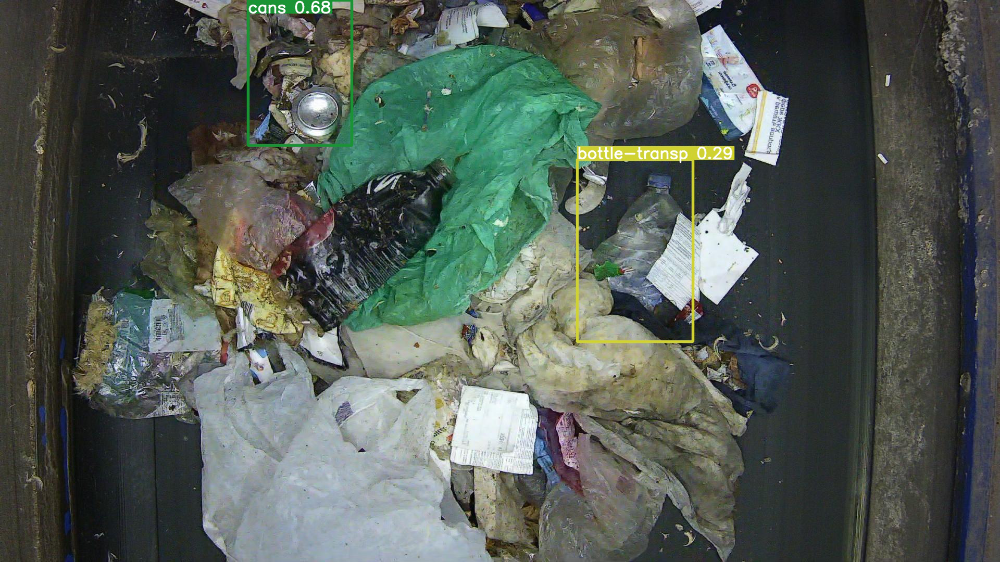

In [17]:
pred2 = Image.open("C:/Users/Patrick/Desktop/CPSC_4830/Final_Exam/yolov8/Warp-D/runs/detect/predict2/Monitoring/Monitoring_photo_2_test_25-Mar_11-37-07.jpg")
display(pred2)

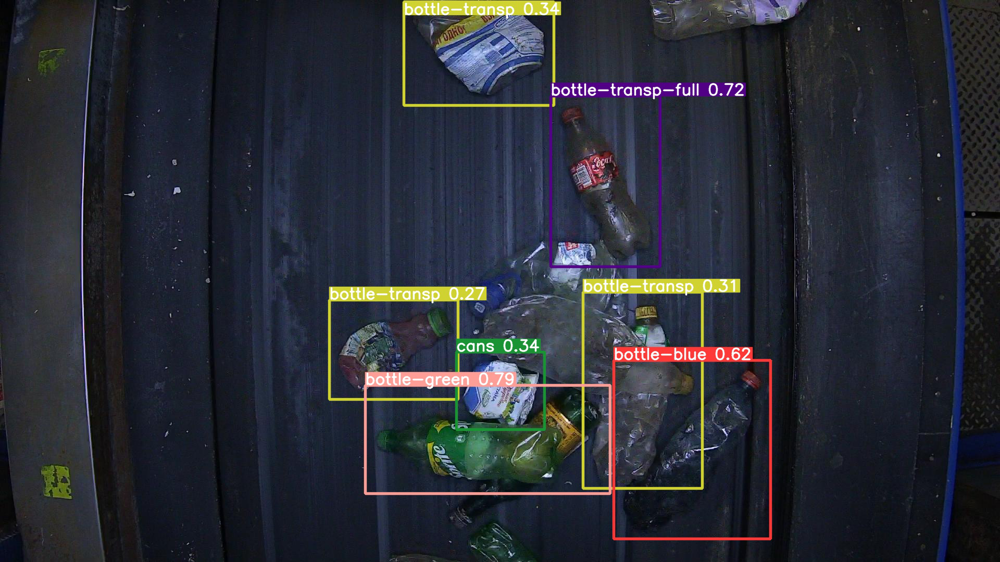

In [18]:
pred3 = Image.open("C:/Users/Patrick/Desktop/CPSC_4830/Final_Exam/yolov8/Warp-D/runs/detect/predict2/Robo_25/Robo_25-Mar_12-39-48.jpg")
display(pred3)

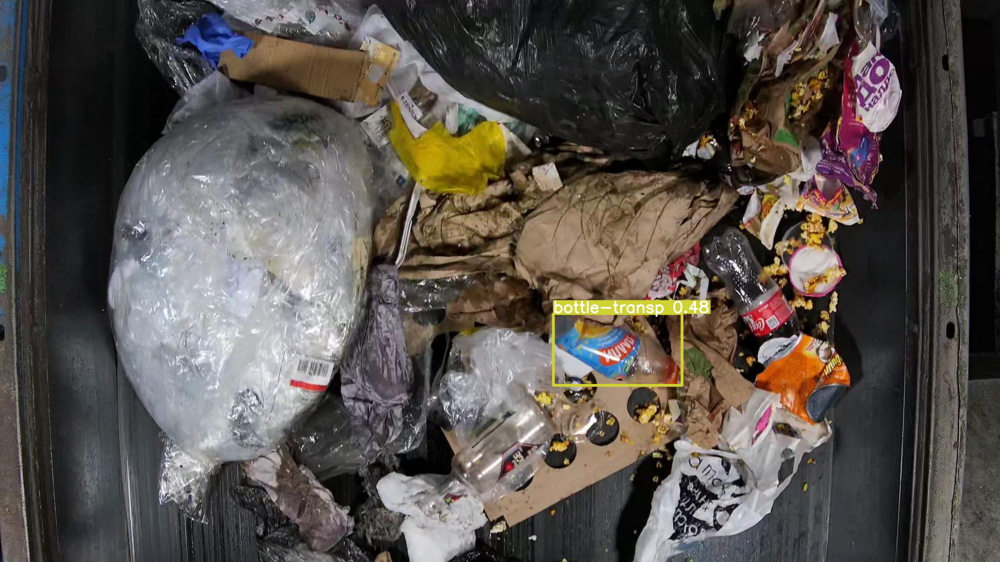

In [19]:
pred4 = Image.open("C:/Users/Patrick/Desktop/CPSC_4830/Final_Exam/yolov8/Warp-D/runs/detect/predict2/prepared_data/prepared_data_all_MGS-05-Nov_02-47-40.jpg")
display(pred4)

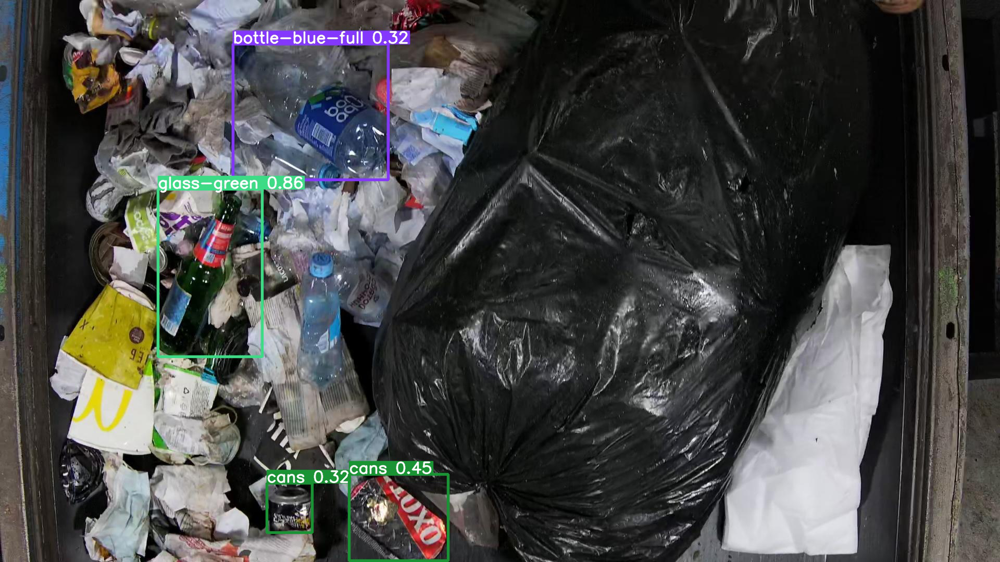

In [20]:
pred5 = Image.open("C:/Users/Patrick/Desktop/CPSC_4830/Final_Exam/yolov8/Warp-D/runs/detect/predict2/prepared_data/prepared_data_all_MGS-05-Nov_02-55-15.jpg")
display(pred5)

Credits: https://www.kaggle.com/datasets/parohod/warp-waste-recycling-plant-dataset

https://raw.githubusercontent.com/AIRI-Institute/WaRP/main/assets/WaRP-Categories.png

